Rainfall Prediction - Weather Forecasting



Problem Statement:

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
 
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:

Number of columns: 23


Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


Dataset available below:




Downlaod Files:
https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv
https://github.com/dsrscientist/dataset3

In [126]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import warnings
import seaborn as sns
import warnings

In [127]:
df=pd.read_csv("weatherAUS.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [128]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [129]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [130]:
df.shape

(8425, 23)

In [131]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

<AxesSubplot:>

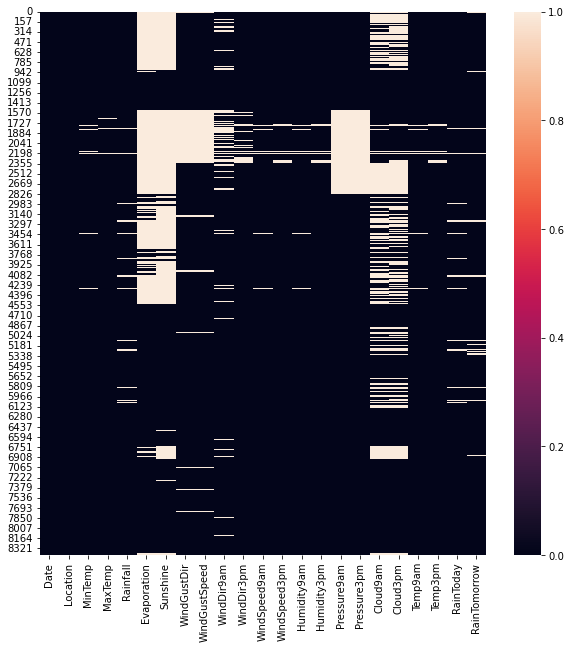

In [132]:
plt.figure(figsize=(10,10))
sns.heatmap(df.isnull())

In [133]:
df['MinTemp']=df['MinTemp'].fillna(df['MinTemp'].median())
df['MaxTemp']=df['MaxTemp'].fillna(df['MaxTemp'].median())
df['Rainfall']=df['Rainfall'].fillna(df['Rainfall'].mean())
df['Evaporation']=df['Evaporation'].fillna(df['Evaporation'].mean())
df['Sunshine']=df['Sunshine'].fillna(df['Sunshine'].mean())
df['WindGustDir']=df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])
df['WindGustSpeed']=df['WindGustSpeed'].fillna(df['WindGustSpeed'].median())
df['WindDir9am']=df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])
df['WindDir3pm']=df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])
df['WindSpeed9am']=df['WindSpeed9am'].fillna(df['WindSpeed9am'].median())
df['WindSpeed3pm']=df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].median())
df['Humidity9am']=df['Humidity9am'].fillna(df['Humidity9am'].median())
df['Humidity3pm']=df['Humidity3pm'].fillna(df['Humidity3pm'].median())
df['Pressure9am']=df['Pressure9am'].fillna(df['Pressure9am'].median())
df['Pressure3pm']=df['Pressure3pm'].fillna(df['Pressure3pm'].median())
df['Cloud9am']=df['Cloud9am'].fillna(df['Cloud9am'].mean())
df['Cloud3pm']=df['Cloud3pm'].fillna(df['Cloud3pm'].mean())
df['Temp9am']=df['Temp9am'].fillna(df['Temp9am'].mean())
df['Temp3pm']=df['Temp3pm'].fillna(df['Temp3pm'].mean())
df['RainToday']=df['RainToday'].fillna(df['RainToday'].mode()[0])
df['RainTomorrow']=df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])

In [134]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

<AxesSubplot:>

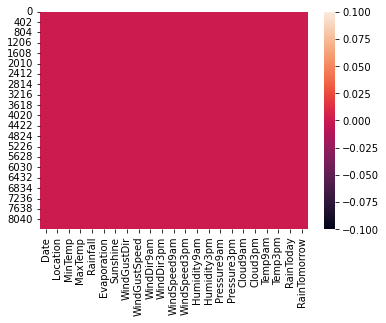

In [135]:
sns.heatmap(df.isnull())

In [136]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [137]:
for i in df:
    print(i,":",df[i].unique())
    print("--------------------------------------------")

Date : ['2008-12-01' '2008-12-02' '2008-12-03' ... '2013-06-06' '2013-06-07'
 '2013-06-08']
--------------------------------------------
Location : ['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru']
--------------------------------------------
MinTemp : [13.4  7.4 12.9  9.2 17.5 14.6 14.3  7.7  9.7 13.1 15.9 12.6  8.4  9.8
 14.1 13.5 11.2 11.5 17.1 20.5 15.3 16.2 16.9 20.1 19.7 12.5 12.  11.3
  9.6 10.5 12.3 13.7 16.1 14.  17.  17.3 17.2 17.4 19.8 14.9 13.9 18.6
 19.3 24.4 18.8 20.8 15.7 18.5 20.4 21.8 22.3 22.  28.  21.5 21.7 23.5
 28.3 18.4 12.4 13.3 18.  18.7 15.5  8.9 15.  15.4 16.  12.8 13.2 13.8
  7.6  8.3 11.  20.9 16.4 10.   8.8  9.3 14.4 10.8 10.1  9.1 10.4 12.2
 10.7  7.8  8.1  7.5  8.2 11.6 13.   9.9  3.5  6.6  7.   5.7  6.2  6.
 10.6  8.6  4.5  5.4  2.1  1.8  7.2  4.6  4.2  5.2  4.1  3.2  4.3  3.7
  3.6  6.9 10.3  3.   2.6  5.1  4.4  4.7  6.7  8.   2.2  1.7  2.8  9.
  6.3 -2.  -1.3  2

In [138]:
for i in df:
    print("----------------------------------------------------------")
    print(i,":",df[i].value_counts())
    print('----------------------------------------------------------')
    print(i,":",df.dtypes[i])
    print("----------------------------------------------------------")

----------------------------------------------------------
Date : 2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
             ..
2013-01-28    1
2013-01-29    1
2013-01-30    1
2013-01-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64
----------------------------------------------------------
Date : object
----------------------------------------------------------
----------------------------------------------------------
Location : Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64
----------------------------------------------------------
Location : object
----------------------------------------------------------
----------------------------------------------------------
MinTemp :  13.3    139
 12.0     74
 13.2

In [139]:
for i in df:
    print("----------------------------------------------------")
    print(i,":",df.loc[df[i]==" "])
    print("-----------------------------------------------------")

----------------------------------------------------
Date : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RainTomorrow]
Index: []

[0 rows x 23 columns]
-----------------------------------------------------
----------------------------------------------------
Location : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RainTomorrow]
Index: []

[0 rows x 23 columns]
-----------------------------------------------------
----------------------------------------------------
MinTemp : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rai

In [140]:
for i in df:
    print("----------------------------------------------------")
    print(i,":",df.loc[df[i]=="nan"])
    print("-----------------------------------------------------")

----------------------------------------------------
Date : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RainTomorrow]
Index: []

[0 rows x 23 columns]
-----------------------------------------------------
----------------------------------------------------
Location : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RainTomorrow]
Index: []

[0 rows x 23 columns]
-----------------------------------------------------
----------------------------------------------------
MinTemp : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rai

In [141]:
for i in df:
    print("----------------------------------------------------")
    print(i,":",df.loc[df[i]=="NaN"])
    print("-----------------------------------------------------")

----------------------------------------------------
Date : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RainTomorrow]
Index: []

[0 rows x 23 columns]
-----------------------------------------------------
----------------------------------------------------
Location : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RainTomorrow]
Index: []

[0 rows x 23 columns]
-----------------------------------------------------
----------------------------------------------------
MinTemp : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rai

In [142]:
for i in df:
    print("----------------------------------------------------")
    print(i,":",df.loc[df[i]=="Null"])
    print("-----------------------------------------------------")

----------------------------------------------------
Date : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RainTomorrow]
Index: []

[0 rows x 23 columns]
-----------------------------------------------------
----------------------------------------------------
Location : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustDir, WindGustSpeed, WindDir9am, WindDir3pm, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, RainToday, RainTomorrow]
Index: []

[0 rows x 23 columns]
-----------------------------------------------------
----------------------------------------------------
MinTemp : Empty DataFrame
Columns: [Date, Location, MinTemp, MaxTemp, Rai

In [143]:
df_cat=[]

for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        df_cat.append(i)
    
df_cat

['Date',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [144]:
df_num=[]

for i in df.dtypes.index:
    if df.dtypes[i]=="int64" or df.dtypes[i]=="float64":
        df_num.append(i)
    
df_num

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [145]:
for i in df_num:
    print(df[i].dtypes)

float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64


In [146]:
for i in df_cat:
    print(df[i].dtypes)

object
object
object
object
object
object
object


In [147]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.194255,23.855988,2.805913,5.389395,7.632205,40.036320,13.840000,18.539585,67.823739,51.246766,1017.649519,1015.246030,4.566622,4.503183,17.762015,22.442934
std,5.379497,6.114697,10.309308,3.852004,2.825451,13.781296,10.128896,9.704899,16.774237,18.311914,6.275796,6.217494,2.429205,2.299419,5.608301,5.945849
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000
50%,13.300000,23.300000,0.000000,5.389395,7.632205,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,4.566622,4.503183,17.762015,22.000000
75%,17.300000,28.000000,1.400000,5.389395,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [148]:
df.drop(['Date'],inplace=True,axis=1)
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,5.389395,7.632205,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
1,Albury,7.4,25.1,0.0,5.389395,7.632205,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2,Albury,12.9,25.7,0.0,5.389395,7.632205,WSW,46.0,W,WSW,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
3,Albury,9.2,28.0,0.0,5.389395,7.632205,NE,24.0,SE,E,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
4,Albury,17.5,32.3,1.0,5.389395,7.632205,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,5.389395,7.632205,E,31.0,SE,ENE,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No
8421,Uluru,3.6,25.3,0.0,5.389395,7.632205,NNW,22.0,SE,N,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No
8422,Uluru,5.4,26.9,0.0,5.389395,7.632205,N,37.0,SE,WNW,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No
8423,Uluru,7.8,27.0,0.0,5.389395,7.632205,SE,28.0,SSE,N,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No


In [149]:
df.corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
MinTemp,1.000000,0.717522,0.087741,0.254965,0.056190,0.230200,0.136643,0.178137,-0.130711,0.079143,-0.429683,-0.423261,0.091593,0.038410,0.887108,0.685502
MaxTemp,0.717522,1.000000,-0.087375,0.322398,0.378365,0.139909,0.013444,0.088300,-0.391081,-0.421952,-0.325758,-0.403283,-0.253956,-0.250181,0.866084,0.974498
Rainfall,0.087741,-0.087375,1.000000,0.023517,-0.169432,0.085264,0.050480,0.024754,0.228799,0.235455,-0.072665,-0.033648,0.185444,0.150760,-0.007083,-0.090687
Evaporation,0.254965,0.322398,0.023517,1.000000,0.226001,0.135438,0.103321,0.101160,-0.213109,-0.161659,-0.177786,-0.189557,-0.062283,-0.108022,0.305264,0.315109
Sunshine,0.056190,0.378365,-0.169432,0.226001,1.000000,-0.013973,-0.018087,0.030154,-0.360836,-0.440269,0.021887,-0.035861,-0.533391,-0.547304,0.250640,0.395324
WindGustSpeed,0.230200,0.139909,0.085264,0.135438,-0.013973,1.000000,0.606090,0.639042,-0.271865,-0.093637,-0.407139,-0.372553,0.025104,0.079348,0.202277,0.102006
WindSpeed9am,0.136643,0.013444,0.050480,0.103321,-0.018087,0.606090,1.000000,0.560340,-0.358391,-0.110545,-0.175584,-0.139429,-0.000605,0.058136,0.109639,-0.002766
WindSpeed3pm,0.178137,0.088300,0.024754,0.101160,0.030154,0.639042,0.560340,1.000000,-0.250930,-0.091056,-0.252752,-0.208694,0.004851,0.003307,0.184066,0.066150
Humidity9am,-0.130711,-0.391081,0.228799,-0.213109,-0.360836,-0.271865,-0.358391,-0.250930,1.000000,0.633285,0.142861,0.173934,0.404743,0.296874,-0.378344,-0.382404
Humidity3pm,0.079143,-0.421952,0.235455,-0.161659,-0.440269,-0.093637,-0.110545,-0.091056,0.633285,1.000000,0.001702,0.070454,0.424415,0.439964,-0.130360,-0.491483


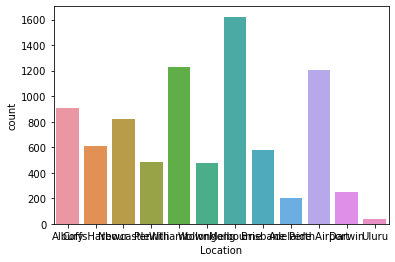

In [150]:
sns.countplot(df['Location'])
plt.show()

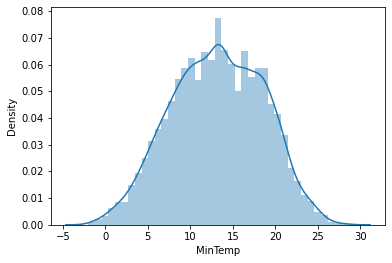

In [151]:
sns.distplot(df['MinTemp'])
plt.show()

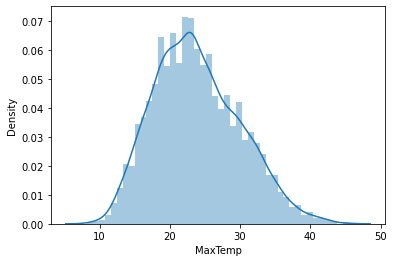

In [152]:
sns.distplot(df['MaxTemp'])
plt.show()

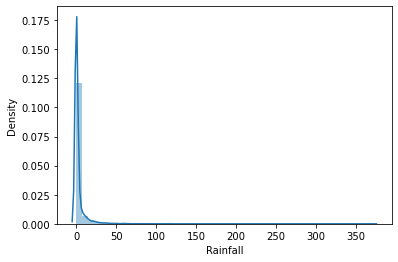

In [153]:
sns.distplot(df['Rainfall'])
plt.show()

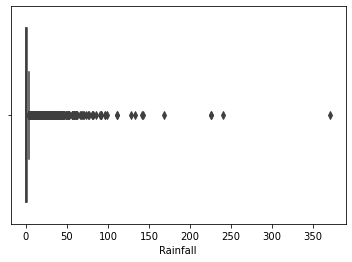

In [154]:
sns.boxplot(df['Rainfall'])
plt.show()

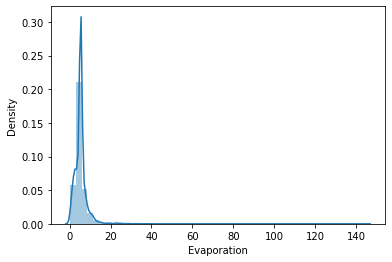

In [155]:
sns.distplot(df['Evaporation'])
plt.show()

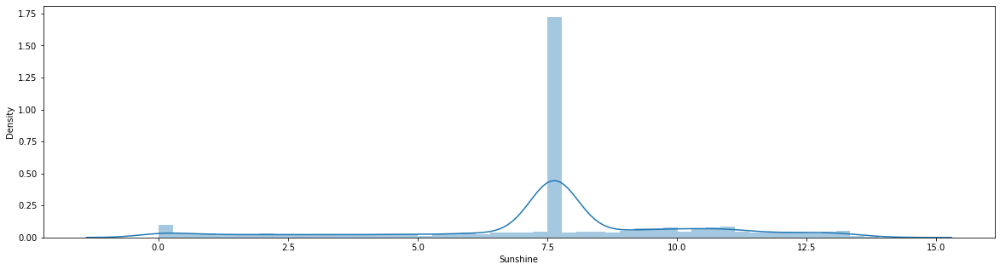

In [156]:
plt.figure(figsize=(20,5))
sns.distplot(df['Sunshine'])
plt.show()

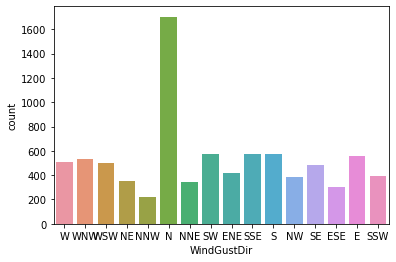

In [157]:
sns.countplot(df['WindGustDir'])
plt.show()

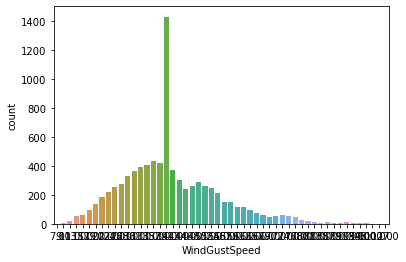

In [158]:
sns.countplot(df['WindGustSpeed'])
plt.show()

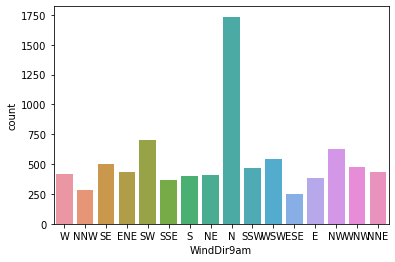

In [159]:
sns.countplot(df['WindDir9am'])
plt.show()

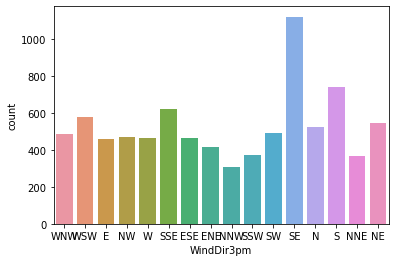

In [160]:
sns.countplot(df['WindDir3pm'])
plt.show()

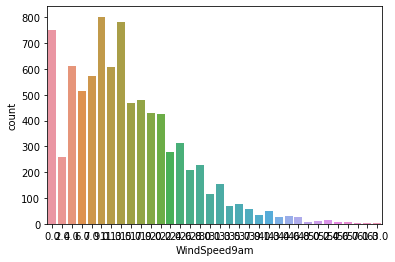

In [161]:
sns.countplot(df['WindSpeed9am'])
plt.show()

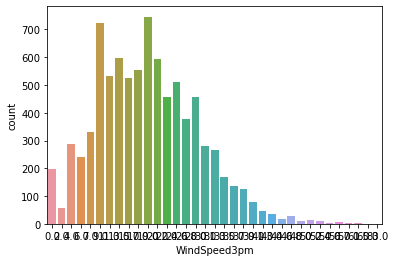

In [162]:
sns.countplot(df['WindSpeed3pm'])
plt.show()

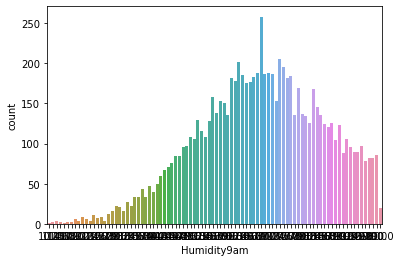

In [163]:
sns.countplot(df['Humidity9am'])
plt.show()

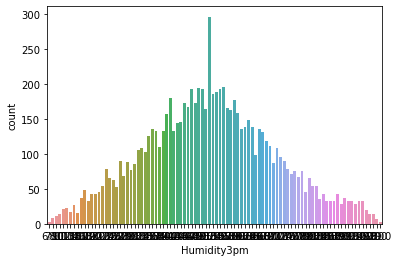

In [164]:
sns.countplot(df['Humidity3pm'])
plt.show()

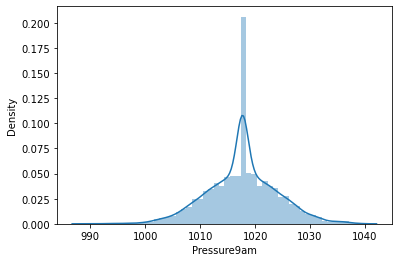

In [165]:
sns.distplot(df['Pressure9am'])
plt.show()

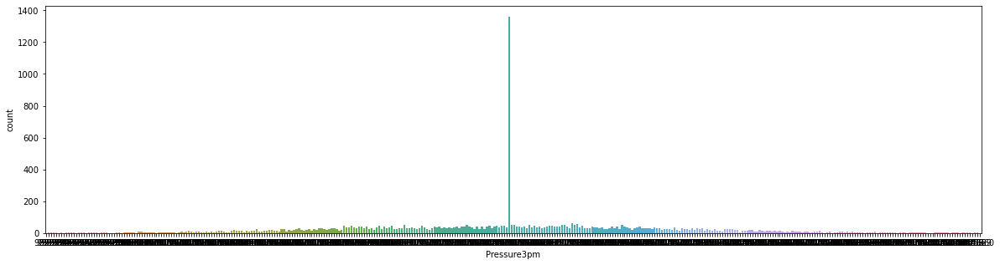

In [166]:
plt.figure(figsize=(20,5))
sns.countplot(df['Pressure3pm'])
plt.show()

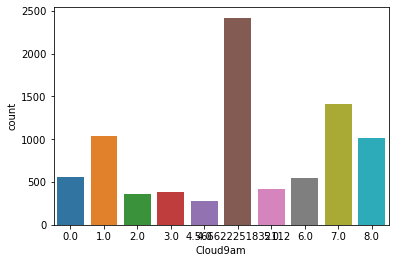

In [167]:
sns.countplot(df['Cloud9am'])
plt.show()

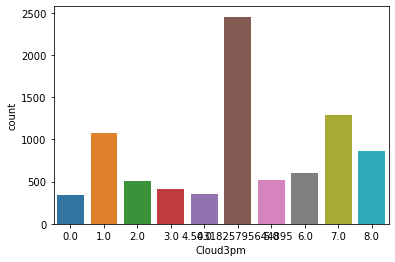

In [168]:
sns.countplot(df['Cloud3pm'])
plt.show()

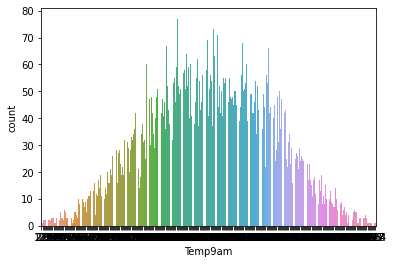

In [169]:
sns.countplot(df['Temp9am'])
plt.show()

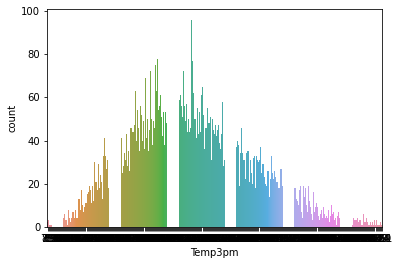

In [170]:
sns.countplot(df['Temp3pm'])
plt.show()

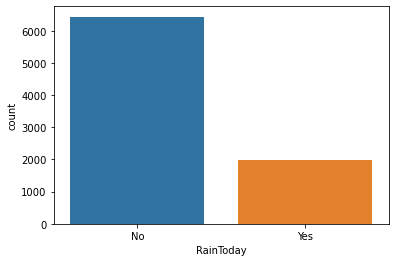

In [171]:
sns.countplot(df['RainToday'])
plt.show()

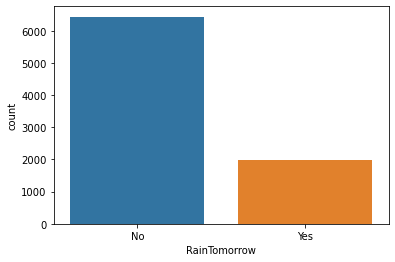

In [172]:
sns.countplot(df['RainTomorrow'])
plt.show()

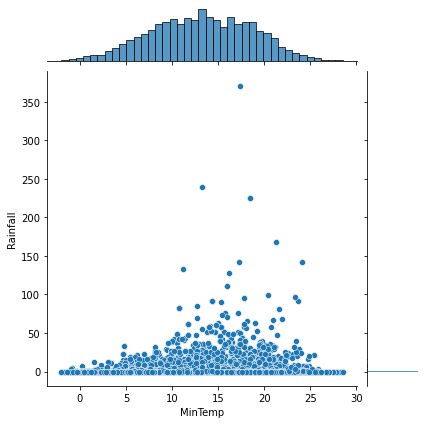

In [173]:
sns.jointplot(x='MinTemp',y='Rainfall',data=df)
plt.show()

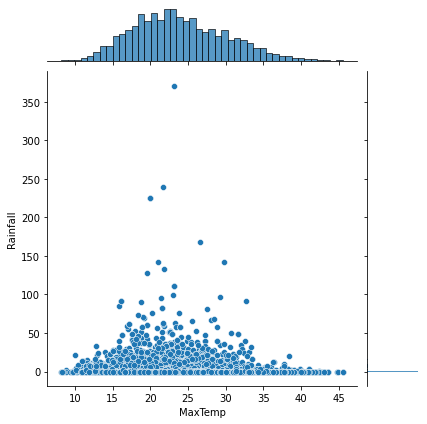

In [174]:
sns.jointplot(x='MaxTemp',y='Rainfall',data=df)
plt.show()

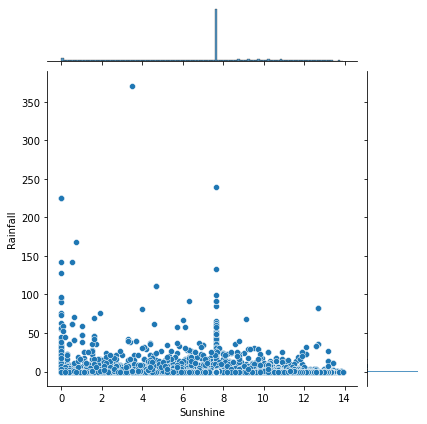

In [175]:
sns.jointplot(x='Sunshine',y='Rainfall',data=df)
plt.show()

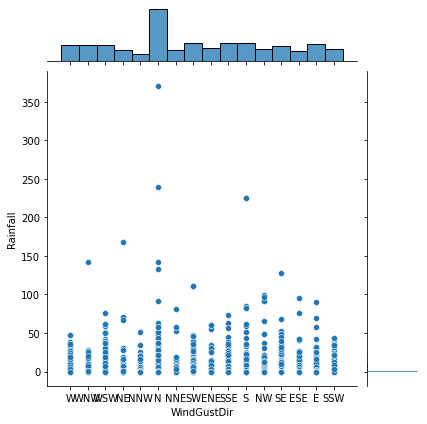

In [176]:
sns.jointplot(x='WindGustDir',y='Rainfall',data=df)
plt.show()

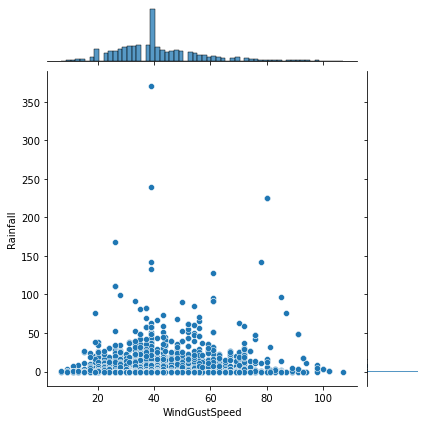

In [177]:
sns.jointplot(x='WindGustSpeed',y='Rainfall',data=df)
plt.show()

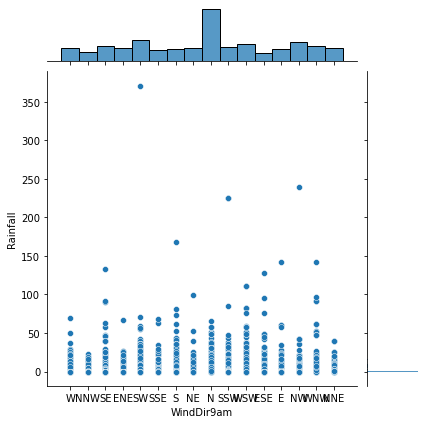

In [178]:
sns.jointplot(x='WindDir9am',y='Rainfall',data=df)
plt.show()

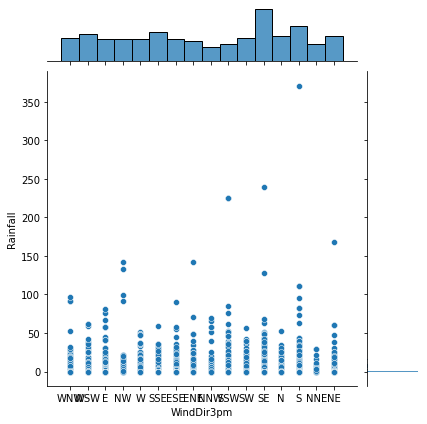

In [179]:
sns.jointplot(x='WindDir3pm',y='Rainfall',data=df)
plt.show()

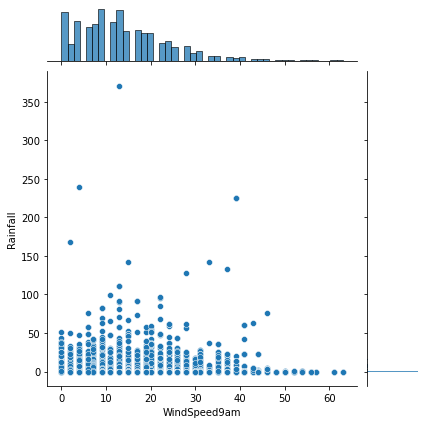

In [180]:
sns.jointplot(x='WindSpeed9am',y='Rainfall',data=df)
plt.show()

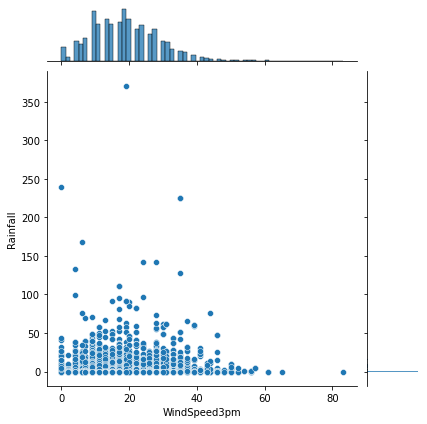

In [181]:
sns.jointplot(x='WindSpeed3pm',y='Rainfall',data=df)
plt.show()

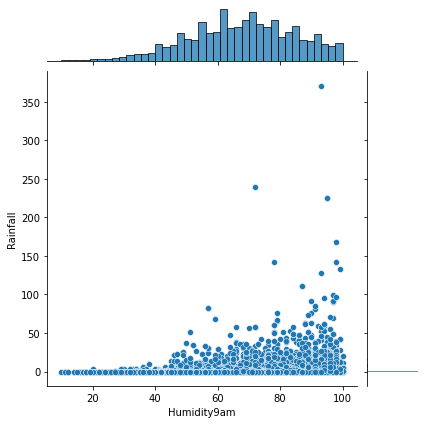

In [182]:
sns.jointplot(x='Humidity9am',y='Rainfall',data=df)
plt.show()

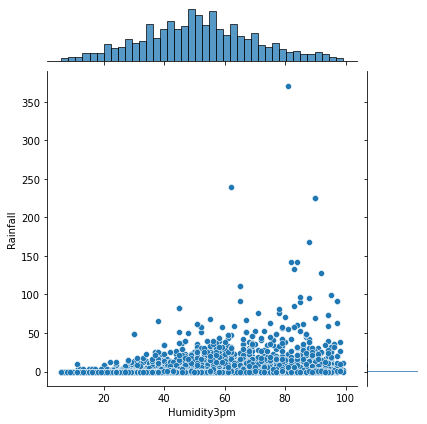

In [183]:
sns.jointplot(x='Humidity3pm',y='Rainfall',data=df)
plt.show()

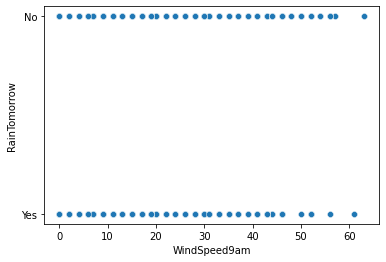

In [184]:
sns.scatterplot(x='WindSpeed9am',y='RainTomorrow',data=df)
plt.show()

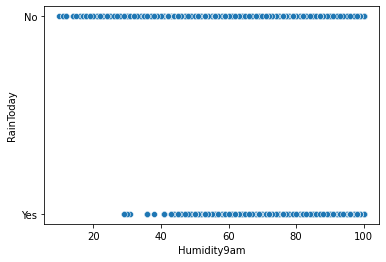

In [185]:
sns.scatterplot(x='Humidity9am',y='RainToday',data=df)
plt.show()

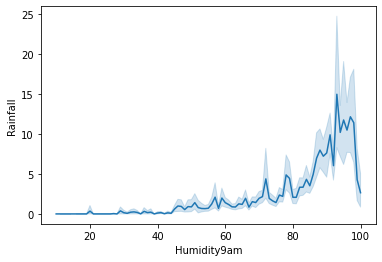

In [186]:
sns.lineplot(x='Humidity9am',y='Rainfall',data=df)
plt.show()

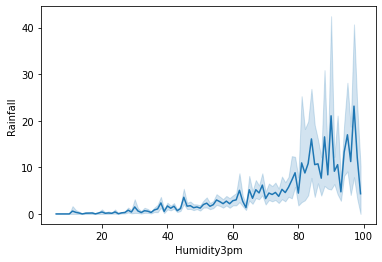

In [187]:
sns.lineplot(x='Humidity3pm',y='Rainfall',data=df)
plt.show()

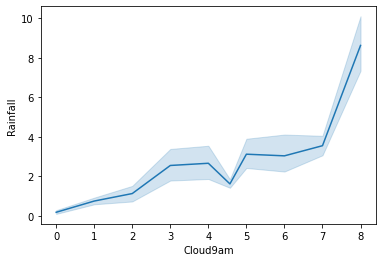

In [188]:
sns.lineplot(x='Cloud9am',y='Rainfall',data=df)
plt.show()

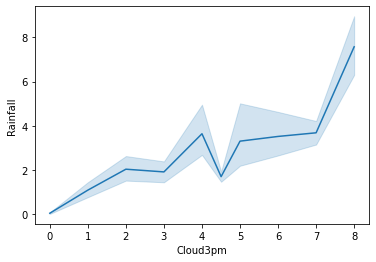

In [189]:
sns.lineplot(x='Cloud3pm',y='Rainfall',data=df)
plt.show()

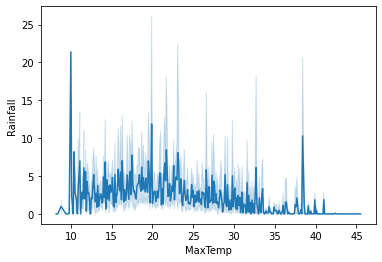

In [190]:
sns.lineplot(x='MaxTemp',y='Rainfall',data=df)
plt.show()

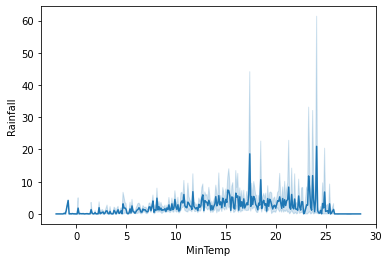

In [191]:
sns.lineplot(x='MinTemp',y='Rainfall',data=df)
plt.show()

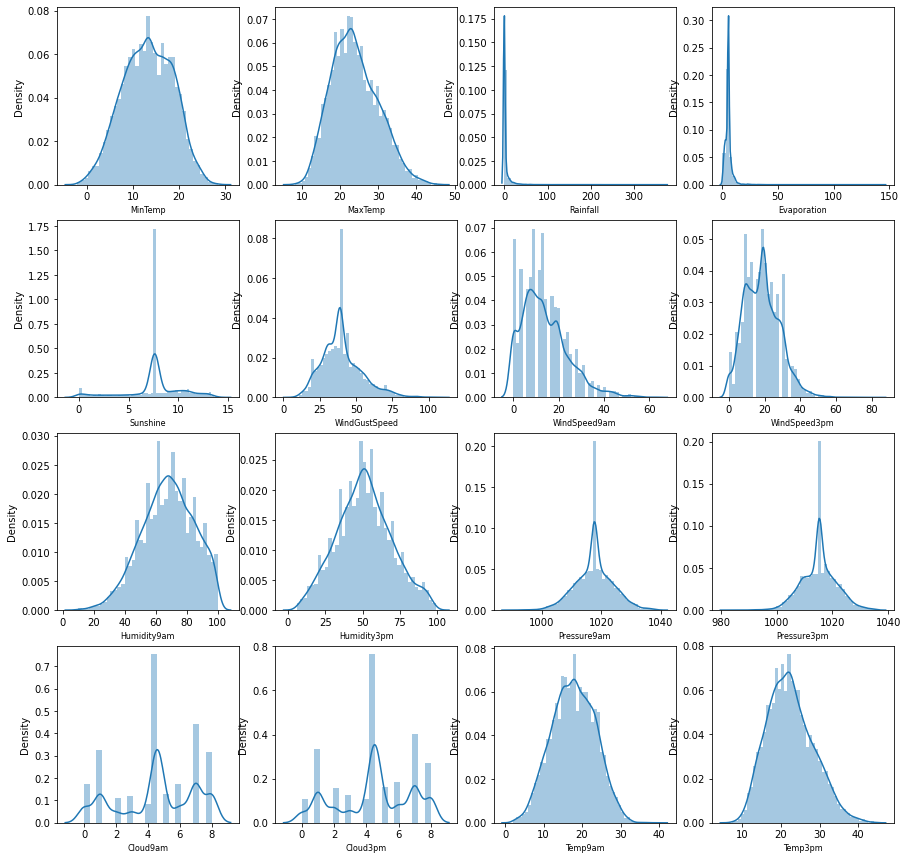

In [192]:
plt.figure(figsize=(15,15),facecolor='white')
plotnum=1
for col in df_num:
    if plotnum<=16:
        plt.subplot(4,4,plotnum)
        sns.distplot(df[col])
        plt.xlabel(col,fontsize=8)
    plotnum+=1
plt.show()

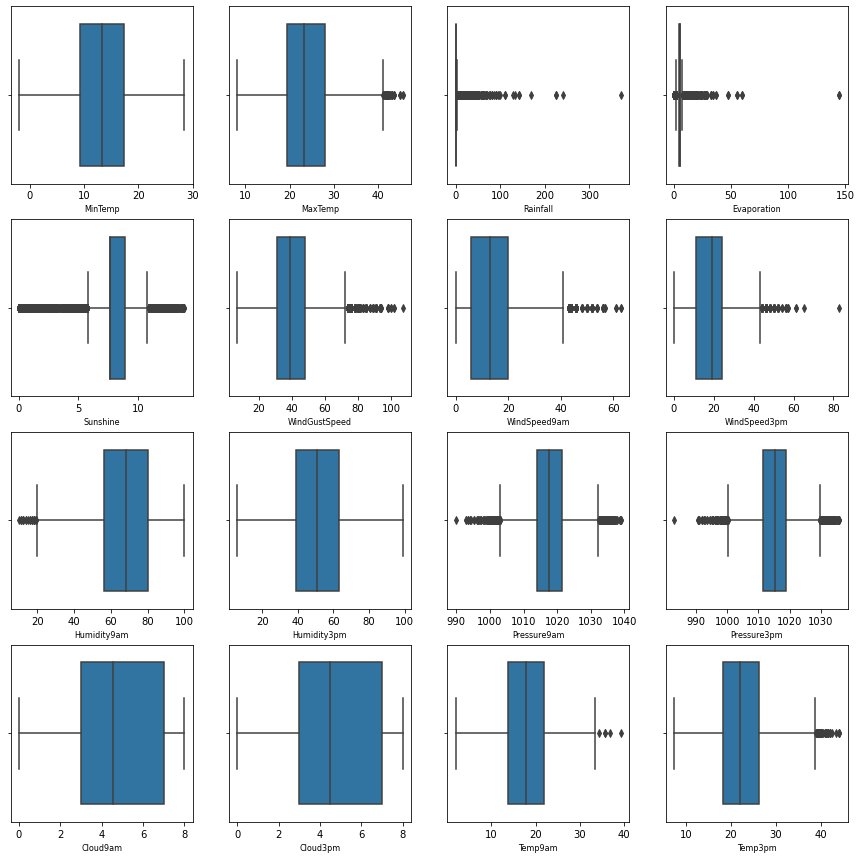

In [193]:
plt.figure(figsize=(15,15),facecolor='white')
plotnum=1
for col in df_num:
    if plotnum<=16:
        plt.subplot(4,4,plotnum)
        sns.boxplot(df[col])
        plt.xlabel(col,fontsize=8)
    plotnum+=1
plt.show()

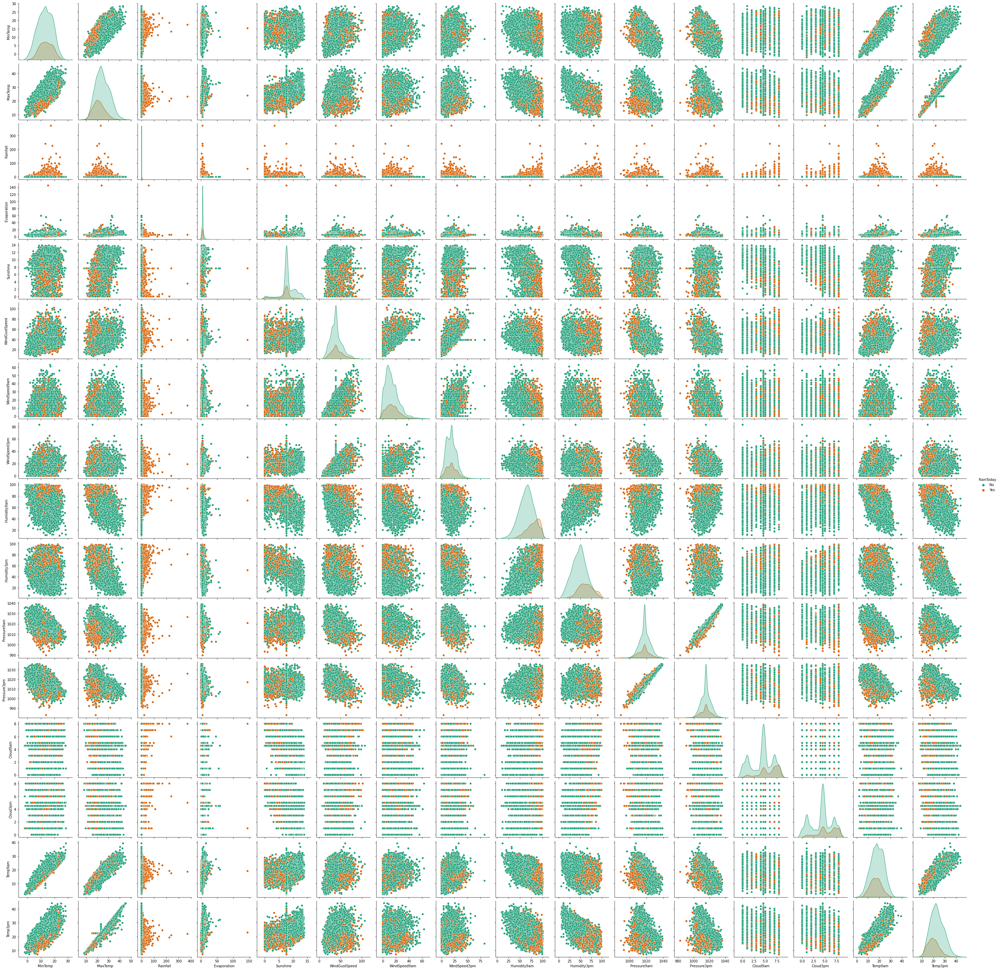

In [194]:
sns.pairplot(df,hue="RainToday",palette="Dark2")
plt.show()

In [195]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()

for i in df.columns:
    if df[i].dtypes=="object":
        df[i]=oe.fit_transform(df[i].values.reshape(-1,1))
        
print(df)

      Location  MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  \
0          1.0     13.4     22.9       0.6     5.389395  7.632205   
1          1.0      7.4     25.1       0.0     5.389395  7.632205   
2          1.0     12.9     25.7       0.0     5.389395  7.632205   
3          1.0      9.2     28.0       0.0     5.389395  7.632205   
4          1.0     17.5     32.3       1.0     5.389395  7.632205   
...        ...      ...      ...       ...          ...       ...   
8420       9.0      2.8     23.4       0.0     5.389395  7.632205   
8421       9.0      3.6     25.3       0.0     5.389395  7.632205   
8422       9.0      5.4     26.9       0.0     5.389395  7.632205   
8423       9.0      7.8     27.0       0.0     5.389395  7.632205   
8424       9.0     14.9     23.3       0.0     5.389395  7.632205   

      WindGustDir  WindGustSpeed  WindDir9am  WindDir3pm  ...  Humidity9am  \
0            13.0           44.0        13.0        14.0  ...         71.0   
1            14

Remove Outliers:

In [196]:
# Using Inter Quantile Range Method for the removal of the outlier:
q1=df.quantile(.25)
q3=df.quantile(.75)
iqr=q3-q1

df1=df[~((df<(q1-1.5*iqr))|(df>(1.5*iqr+q3))).any(axis=1)]
df1.reset_index(inplace=True)
df1

,index,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,1.0,13.4,22.9,0.6,5.389395,7.632205,13.0,44.0,13.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1,1.0,7.4,25.1,0.0,5.389395,7.632205,14.0,44.0,6.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,2,1.0,12.9,25.7,0.0,5.389395,7.632205,15.0,46.0,13.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,3,1.0,9.2,28.0,0.0,5.389395,7.632205,4.0,24.0,9.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,4,1.0,17.5,32.3,1.0,5.389395,7.632205,13.0,41.0,1.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3274,8420,9.0,2.8,23.4,0.0,5.389395,7.632205,0.0,31.0,9.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
3275,8421,9.0,3.6,25.3,0.0,5.389395,7.632205,6.0,22.0,9.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
3276,8422,9.0,5.4,26.9,0.0,5.389395,7.632205,3.0,37.0,9.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
3277,8423,9.0,7.8,27.0,0.0,5.389395,7.632205,9.0,28.0,10.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


In [197]:
df1.skew()

index            0.474702
Location        -0.039018
MinTemp          0.000848
MaxTemp          0.305051
Rainfall         4.631072
Evaporation     -1.143451
Sunshine         1.286686
WindGustDir      0.240455
WindGustSpeed    0.216122
WindDir9am       0.249999
WindDir3pm      -0.050900
WindSpeed9am     0.832548
WindSpeed3pm     0.341556
Humidity9am     -0.028922
Humidity3pm      0.027386
Pressure9am     -0.000147
Pressure3pm     -0.064316
Cloud9am        -0.300330
Cloud3pm        -0.224590
Temp9am         -0.144978
Temp3pm          0.324776
RainToday        0.000000
RainTomorrow     0.000000
dtype: float64

In [198]:
data_loss_df1=((8425-4221)/8425*100)-1
data_loss_df1

48.89910979228487

In [199]:
# Using Zscore method:
num=df[['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm']]
from scipy.stats import zscore
z=np.abs(zscore(num))
threshold=3
df2=df[(z<3).all(axis=1)]
df2

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1.0,13.4,22.9,0.6,5.389395,7.632205,13.0,44.0,13.0,14.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,7.4,25.1,0.0,5.389395,7.632205,14.0,44.0,6.0,15.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,1.0,12.9,25.7,0.0,5.389395,7.632205,15.0,46.0,13.0,15.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,1.0,9.2,28.0,0.0,5.389395,7.632205,4.0,24.0,9.0,0.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,1.0,17.5,32.3,1.0,5.389395,7.632205,13.0,41.0,1.0,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.0,5.389395,7.632205,0.0,31.0,9.0,1.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
8421,9.0,3.6,25.3,0.0,5.389395,7.632205,6.0,22.0,9.0,3.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
8422,9.0,5.4,26.9,0.0,5.389395,7.632205,3.0,37.0,9.0,14.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
8423,9.0,7.8,27.0,0.0,5.389395,7.632205,9.0,28.0,10.0,3.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


In [200]:
df2.skew()

Location        -0.040284
MinTemp         -0.085084
MaxTemp          0.316587
Rainfall         3.488446
Evaporation      0.846181
Sunshine        -0.723970
WindGustDir      0.112339
WindGustSpeed    0.539852
WindDir9am       0.160081
WindDir3pm      -0.126255
WindSpeed9am     0.713786
WindSpeed3pm     0.298085
Humidity9am     -0.231895
Humidity3pm      0.125670
Pressure9am      0.015962
Pressure3pm      0.039711
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
RainToday        1.301170
RainTomorrow     1.296077
dtype: float64

In [201]:
data_loss_df2=((8425-7987)/8425*100)-1
data_loss_df2

4.198813056379822

Hence, we accept zscore method for the removal of the outliers

Check and remove the skewness:

In [202]:
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer(method='yeo-johnson')

In [203]:
#take the threshold=.7
skew=['Rainfall','Evaporation']
df2[skew]=pt.fit_transform(df2[skew].values)

df2.skew()

Location        -0.040284
MinTemp         -0.085084
MaxTemp          0.316587
Rainfall         0.913570
Evaporation      0.074744
Sunshine        -0.723970
WindGustDir      0.112339
WindGustSpeed    0.539852
WindDir9am       0.160081
WindDir3pm      -0.126255
WindSpeed9am     0.713786
WindSpeed3pm     0.298085
Humidity9am     -0.231895
Humidity3pm      0.125670
Pressure9am      0.015962
Pressure3pm      0.039711
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
RainToday        1.301170
RainTomorrow     1.296077
dtype: float64

Now the skewness removed from the df2 data.

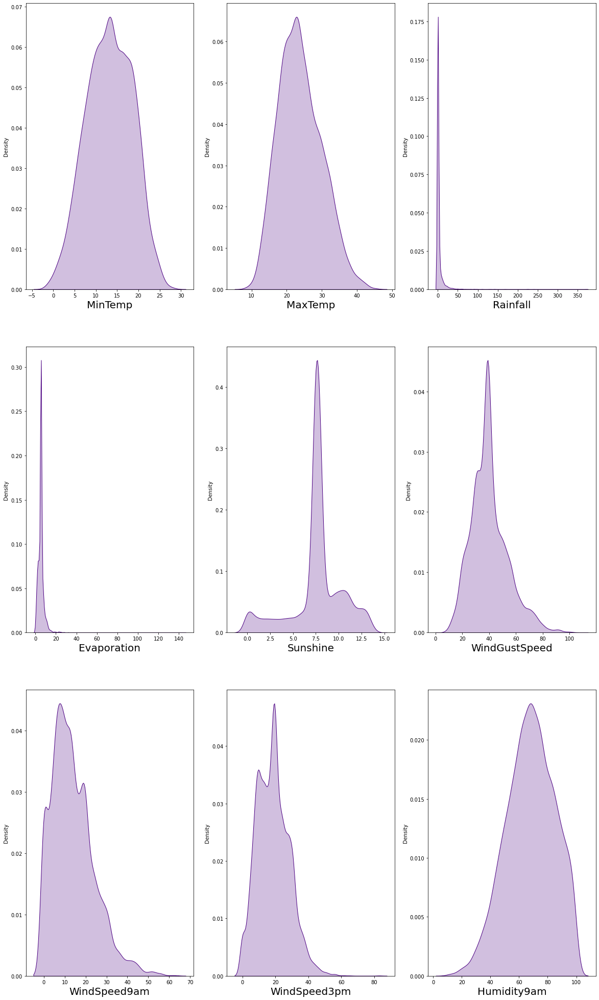

In [207]:
plt.figure(figsize=(20,35))
plotnumber=1

for i in df[df_num]:
    if plotnumber<=9:
        ax = plt.subplot(3,3,plotnumber)
        sns.distplot(df[i],color='indigo',kde_kws={"shade": True},hist=False)
        plt.xlabel(i,fontsize=20)
    plotnumber+=1
plt.show()
    

<Figure size 1440x2880 with 0 Axes>

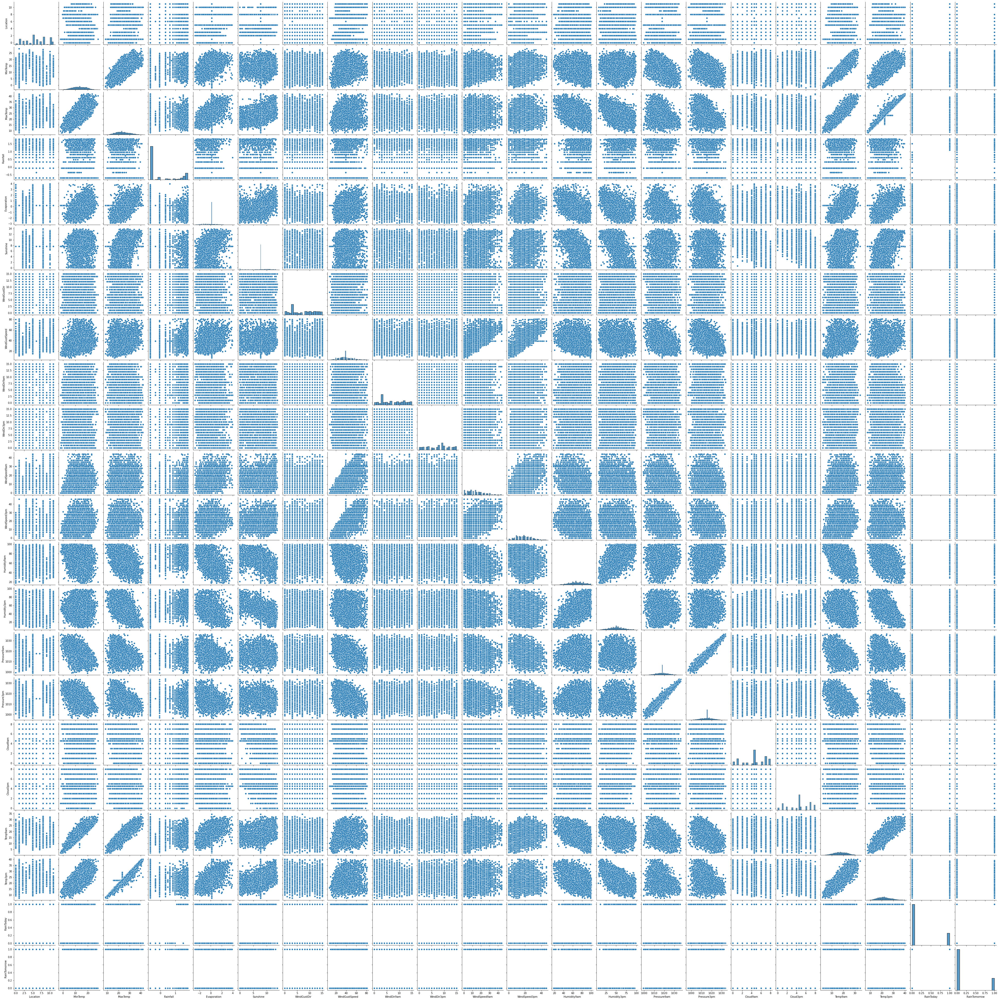

In [208]:
plt.figure(figsize=(20,40))
sns.pairplot(df2,palette='Dark2')
plt.show()

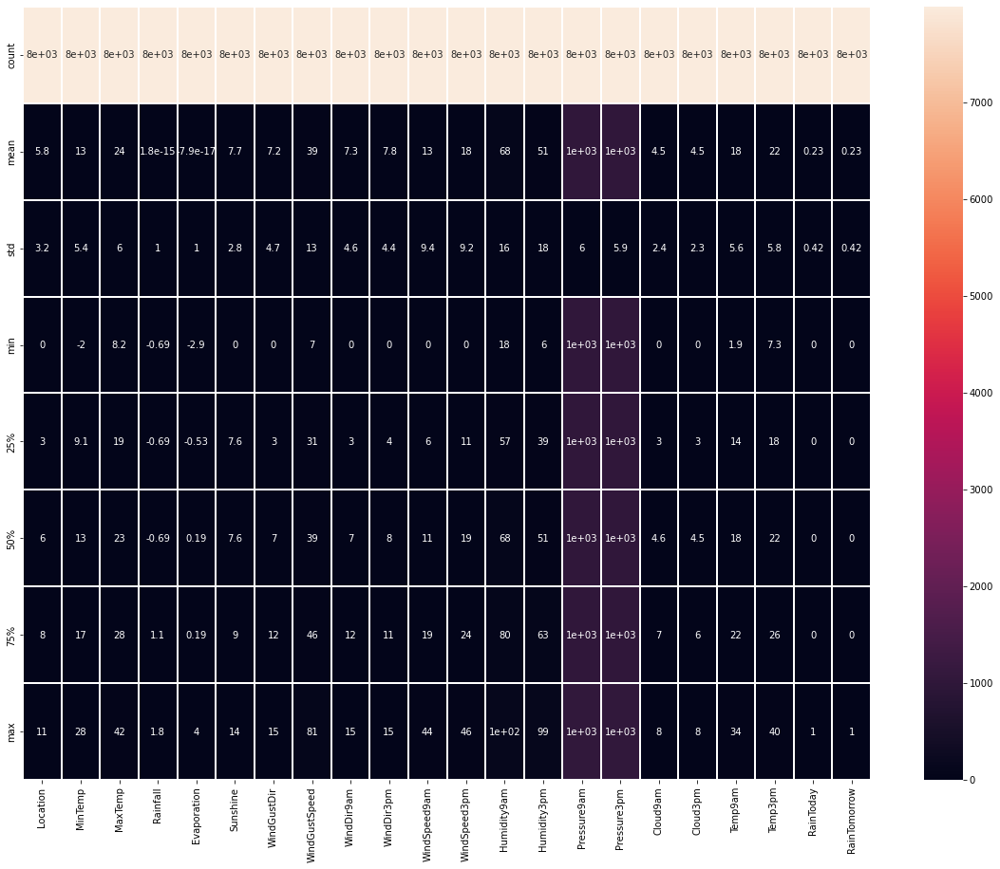

In [209]:
plt.figure(figsize=(20,15))
sns.heatmap(df2.describe(),annot=True,linewidth=.2,fmt='.2g')
plt.show()

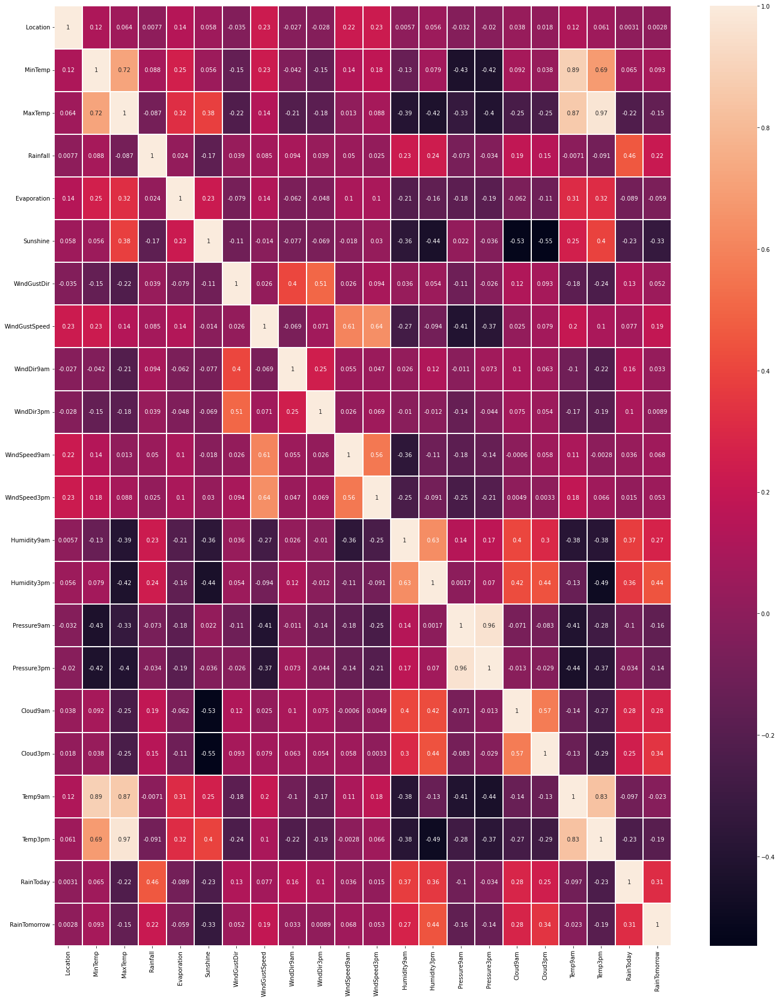

In [210]:
plt.figure(figsize=(24,30))
sns.heatmap(df.corr(),annot=True,linewidth=.2,fmt='.2g')
plt.show()

In [211]:
df2.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.116723,0.063738,0.025575,0.131179,0.048579,-0.037707,0.244310,-0.041030,-0.031195,...,0.003746,0.059951,-0.023952,-0.011962,0.041859,0.027050,0.118100,0.060707,0.002934,0.009222
MinTemp,0.116723,1.000000,0.718593,0.077289,0.372285,0.065682,-0.155067,0.231321,-0.045369,-0.154166,...,-0.126361,0.090304,-0.433393,-0.428235,0.089349,0.036652,0.888675,0.687549,0.061684,0.091054
MaxTemp,0.063738,0.718593,1.000000,-0.237364,0.472187,0.387022,-0.237321,0.136065,-0.216792,-0.190490,...,-0.382799,-0.409643,-0.333588,-0.414367,-0.252577,-0.248332,0.864910,0.974950,-0.219557,-0.149490
Rainfall,0.025575,0.077289,-0.237364,1.000000,-0.197771,-0.262098,0.142840,0.094083,0.157531,0.120391,...,0.401585,0.378001,-0.125454,-0.044278,0.305191,0.263722,-0.103803,-0.248837,0.875795,0.316060
Evaporation,0.131179,0.372285,0.472187,-0.197771,1.000000,0.381619,-0.121155,0.182919,-0.109834,-0.038439,...,-0.315343,-0.227209,-0.262774,-0.277508,-0.111289,-0.144923,0.440687,0.458644,-0.167131,-0.090305
Sunshine,0.048579,0.065682,0.387022,-0.262098,0.381619,1.000000,-0.104739,0.009633,-0.076595,-0.069789,...,-0.366344,-0.437502,-0.004098,-0.063855,-0.527350,-0.541996,0.261680,0.403489,-0.219089,-0.317675
WindGustDir,-0.037707,-0.155067,-0.237321,0.142840,-0.121155,-0.104739,1.000000,0.015216,0.405681,0.507292,...,0.031023,0.051214,-0.095905,-0.009187,0.123415,0.093527,-0.185080,-0.249791,0.121709,0.044378
WindGustSpeed,0.244310,0.231321,0.136065,0.094083,0.182919,0.009633,0.015216,1.000000,-0.065432,0.076140,...,-0.266671,-0.087025,-0.377428,-0.336137,0.015800,0.065196,0.198924,0.101425,0.076934,0.181673
WindDir9am,-0.041030,-0.045369,-0.216792,0.157531,-0.109834,-0.076595,0.405681,-0.065432,1.000000,0.243622,...,0.009502,0.118005,-0.004471,0.080834,0.092396,0.062637,-0.101576,-0.224390,0.149239,0.027091
WindDir3pm,-0.031195,-0.154166,-0.190490,0.120391,-0.038439,-0.069789,0.507292,0.076140,0.243622,1.000000,...,-0.007810,-0.009436,-0.129830,-0.037262,0.073742,0.054321,-0.172000,-0.202000,0.100983,0.003674


In [212]:
df3=df2.copy()

In [213]:
df3

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1.0,13.4,22.9,0.617396,0.186311,7.632205,13.0,44.0,13.0,14.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,7.4,25.1,-0.693670,0.186311,7.632205,14.0,44.0,6.0,15.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,1.0,12.9,25.7,-0.693670,0.186311,7.632205,15.0,46.0,13.0,15.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,1.0,9.2,28.0,-0.693670,0.186311,7.632205,4.0,24.0,9.0,0.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,1.0,17.5,32.3,0.975076,0.186311,7.632205,13.0,41.0,1.0,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,-0.693670,0.186311,7.632205,0.0,31.0,9.0,1.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
8421,9.0,3.6,25.3,-0.693670,0.186311,7.632205,6.0,22.0,9.0,3.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
8422,9.0,5.4,26.9,-0.693670,0.186311,7.632205,3.0,37.0,9.0,14.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
8423,9.0,7.8,27.0,-0.693670,0.186311,7.632205,9.0,28.0,10.0,3.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


Now make partition between the Feature(x) and the Label(y).

In [214]:
x=df2.drop('RainTomorrow',axis=1)
y=df2['RainTomorrow']
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,1.0,13.4,22.9,0.617396,0.186311,7.632205,13.0,44.0,13.0,14.0,...,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0
1,1.0,7.4,25.1,-0.693670,0.186311,7.632205,14.0,44.0,6.0,15.0,...,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0
2,1.0,12.9,25.7,-0.693670,0.186311,7.632205,15.0,46.0,13.0,15.0,...,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0
3,1.0,9.2,28.0,-0.693670,0.186311,7.632205,4.0,24.0,9.0,0.0,...,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0
4,1.0,17.5,32.3,0.975076,0.186311,7.632205,13.0,41.0,1.0,7.0,...,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,-0.693670,0.186311,7.632205,0.0,31.0,9.0,1.0,...,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0
8421,9.0,3.6,25.3,-0.693670,0.186311,7.632205,6.0,22.0,9.0,3.0,...,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0
8422,9.0,5.4,26.9,-0.693670,0.186311,7.632205,3.0,37.0,9.0,14.0,...,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0
8423,9.0,7.8,27.0,-0.693670,0.186311,7.632205,9.0,28.0,10.0,3.0,...,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0


In [215]:
y

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: RainTomorrow, Length: 7987, dtype: float64

In [216]:
x.dtypes

Location         float64
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir      float64
WindGustSpeed    float64
WindDir9am       float64
WindDir3pm       float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday        float64
dtype: object

In [217]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
x=pd.DataFrame(scale.fit_transform(x), columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,-1.508427,0.056265,-0.145028,0.617396,0.186311,-0.013374,1.229267,0.375060,1.250245,1.400214,...,0.637379,0.184044,-1.623998,-1.688792,-1.399888,1.425345,0.013138,-0.138099,-0.098593,-0.542476
1,-1.508427,-1.058650,0.221372,-0.693670,0.186311,-0.013374,1.441960,0.375060,-0.277857,1.626597,...,0.420871,-1.455177,-1.457576,-1.204068,-1.281756,0.011773,0.013138,-0.084254,0.329747,-0.542476
2,-1.508427,-0.036645,0.321299,-0.693670,0.186311,-0.013374,1.654654,0.531529,1.250245,1.626597,...,0.853886,-1.819449,-1.180206,-1.705507,-1.129873,0.011773,-1.076661,0.597788,0.141277,-0.542476
3,-1.508427,-0.724176,0.704353,-0.693670,0.186311,-0.013374,-0.684977,-1.189631,0.377044,-1.769138,...,-0.986428,-1.394465,-1.956843,-0.034045,-0.437958,0.011773,0.013138,0.077282,0.706687,-0.542476
4,-1.508427,0.818123,1.420498,0.975076,0.186311,-0.013374,1.229267,0.140356,-1.369358,-0.184462,...,0.204363,0.851874,-1.013784,-1.170639,-1.585524,1.013630,1.535531,0.023437,1.254963,-0.542476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913418,-0.061755,-0.693670,0.186311,-0.013374,-1.535751,-0.641989,0.377044,-1.542755,...,-0.769921,-1.030194,-1.513050,1.135979,0.827741,0.011773,0.013138,-1.358595,0.004208,-0.542476
7983,1.029423,-1.764762,0.254681,-0.693670,0.186311,-0.013374,-0.259589,-1.346100,0.377044,-1.089991,...,-0.986428,-0.726635,-1.679472,0.952118,0.625229,0.011773,0.013138,-1.215007,0.364014,-0.542476
7984,1.029423,-1.430288,0.521153,-0.693670,0.186311,-0.013374,-0.897670,-0.172582,0.377044,1.400214,...,-0.986428,-0.908770,-1.513050,0.534253,0.237081,0.011773,0.013138,-0.927832,0.638152,-0.542476
7985,1.029423,-0.984322,0.537808,-0.693670,0.186311,-0.013374,0.378492,-0.876693,0.595344,-1.089991,...,-1.202936,-1.030194,-1.513050,0.266819,0.186453,-0.633229,-1.076661,-0.461172,0.621019,-0.542476


In [218]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['Feature']=x.columns
vif['VIF']=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif

,Feature,VIF
0,Location,1.164128
1,MinTemp,8.387450
2,MaxTemp,26.340939
3,Rainfall,4.750624
4,Evaporation,1.552630
5,Sunshine,1.960181
6,WindGustDir,1.598098
7,WindGustSpeed,2.346570
8,WindDir9am,1.341849
9,WindDir3pm,1.473275


In [219]:
x.drop('Temp3pm',axis=1,inplace=True)

x  # now again check multicolinearity of whole dataframe to by vif method. 

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday
0,-1.508427,0.056265,-0.145028,0.617396,0.186311,-0.013374,1.229267,0.375060,1.250245,1.400214,0.713688,0.637379,0.184044,-1.623998,-1.688792,-1.399888,1.425345,0.013138,-0.138099,-0.542476
1,-1.508427,-1.058650,0.221372,-0.693670,0.186311,-0.013374,1.441960,0.375060,-0.277857,1.626597,-0.986603,0.420871,-1.455177,-1.457576,-1.204068,-1.281756,0.011773,0.013138,-0.084254,-0.542476
2,-1.508427,-0.036645,0.321299,-0.693670,0.186311,-0.013374,1.654654,0.531529,1.250245,1.626597,0.607420,0.853886,-1.819449,-1.180206,-1.705507,-1.129873,0.011773,-1.076661,0.597788,-0.542476
3,-1.508427,-0.724176,0.704353,-0.693670,0.186311,-0.013374,-0.684977,-1.189631,0.377044,-1.769138,-0.242726,-0.986428,-1.394465,-1.956843,-0.034045,-0.437958,0.011773,0.013138,0.077282,-0.542476
4,-1.508427,0.818123,1.420498,0.975076,0.186311,-0.013374,1.229267,0.140356,-1.369358,-0.184462,-0.667799,0.204363,0.851874,-1.013784,-1.170639,-1.585524,1.013630,1.535531,0.023437,-0.542476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913418,-0.061755,-0.693670,0.186311,-0.013374,-1.535751,-0.641989,0.377044,-1.542755,-0.030189,-0.769921,-1.030194,-1.513050,1.135979,0.827741,0.011773,0.013138,-1.358595,-0.542476
7983,1.029423,-1.764762,0.254681,-0.693670,0.186311,-0.013374,-0.259589,-1.346100,0.377044,-1.089991,-0.030189,-0.986428,-0.726635,-1.679472,0.952118,0.625229,0.011773,0.013138,-1.215007,-0.542476
7984,1.029423,-1.430288,0.521153,-0.693670,0.186311,-0.013374,-0.897670,-0.172582,0.377044,1.400214,-0.455262,-0.986428,-0.908770,-1.513050,0.534253,0.237081,0.011773,0.013138,-0.927832,-0.542476
7985,1.029423,-0.984322,0.537808,-0.693670,0.186311,-0.013374,0.378492,-0.876693,0.595344,-1.089991,-0.030189,-1.202936,-1.030194,-1.513050,0.266819,0.186453,-0.633229,-1.076661,-0.461172,-0.542476


In [220]:
vif

,Feature,VIF
0,Location,1.164128
1,MinTemp,8.387450
2,MaxTemp,26.340939
3,Rainfall,4.750624
4,Evaporation,1.552630
5,Sunshine,1.960181
6,WindGustDir,1.598098
7,WindGustSpeed,2.346570
8,WindDir9am,1.341849
9,WindDir3pm,1.473275


In [221]:
vif2=pd.DataFrame()
vif2['Feature']=x.columns
vif2['VIF']=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif2

,Feature,VIF
0,Location,1.162383
1,MinTemp,8.324006
2,MaxTemp,9.588326
3,Rainfall,4.750500
4,Evaporation,1.551664
5,Sunshine,1.960094
6,WindGustDir,1.594856
7,WindGustSpeed,2.332444
8,WindDir9am,1.340792
9,WindDir3pm,1.472634


In [222]:
x.drop('Pressure9am',axis=1,inplace=True)

x  # now again check multicolinearity of whole dataframe to by vif method. 

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday
0,-1.508427,0.056265,-0.145028,0.617396,0.186311,-0.013374,1.229267,0.375060,1.250245,1.400214,0.713688,0.637379,0.184044,-1.623998,-1.399888,1.425345,0.013138,-0.138099,-0.542476
1,-1.508427,-1.058650,0.221372,-0.693670,0.186311,-0.013374,1.441960,0.375060,-0.277857,1.626597,-0.986603,0.420871,-1.455177,-1.457576,-1.281756,0.011773,0.013138,-0.084254,-0.542476
2,-1.508427,-0.036645,0.321299,-0.693670,0.186311,-0.013374,1.654654,0.531529,1.250245,1.626597,0.607420,0.853886,-1.819449,-1.180206,-1.129873,0.011773,-1.076661,0.597788,-0.542476
3,-1.508427,-0.724176,0.704353,-0.693670,0.186311,-0.013374,-0.684977,-1.189631,0.377044,-1.769138,-0.242726,-0.986428,-1.394465,-1.956843,-0.437958,0.011773,0.013138,0.077282,-0.542476
4,-1.508427,0.818123,1.420498,0.975076,0.186311,-0.013374,1.229267,0.140356,-1.369358,-0.184462,-0.667799,0.204363,0.851874,-1.013784,-1.585524,1.013630,1.535531,0.023437,-0.542476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913418,-0.061755,-0.693670,0.186311,-0.013374,-1.535751,-0.641989,0.377044,-1.542755,-0.030189,-0.769921,-1.030194,-1.513050,0.827741,0.011773,0.013138,-1.358595,-0.542476
7983,1.029423,-1.764762,0.254681,-0.693670,0.186311,-0.013374,-0.259589,-1.346100,0.377044,-1.089991,-0.030189,-0.986428,-0.726635,-1.679472,0.625229,0.011773,0.013138,-1.215007,-0.542476
7984,1.029423,-1.430288,0.521153,-0.693670,0.186311,-0.013374,-0.897670,-0.172582,0.377044,1.400214,-0.455262,-0.986428,-0.908770,-1.513050,0.237081,0.011773,0.013138,-0.927832,-0.542476
7985,1.029423,-0.984322,0.537808,-0.693670,0.186311,-0.013374,0.378492,-0.876693,0.595344,-1.089991,-0.030189,-1.202936,-1.030194,-1.513050,0.186453,-0.633229,-1.076661,-0.461172,-0.542476


In [223]:
vif3=pd.DataFrame()
vif3['Feature']=x.columns
vif3['VIF']=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif3

,Feature,VIF
0,Location,1.161892
1,MinTemp,8.201627
2,MaxTemp,9.207005
3,Rainfall,4.722062
4,Evaporation,1.532565
5,Sunshine,1.955469
6,WindGustDir,1.580386
7,WindGustSpeed,2.316219
8,WindDir9am,1.321177
9,WindDir3pm,1.404016


In [224]:
x.drop('Temp9am',axis=1,inplace=True)

x  # now again check multicolinearity of whole dataframe to by vif method. 

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday
0,-1.508427,0.056265,-0.145028,0.617396,0.186311,-0.013374,1.229267,0.375060,1.250245,1.400214,0.713688,0.637379,0.184044,-1.623998,-1.399888,1.425345,0.013138,-0.542476
1,-1.508427,-1.058650,0.221372,-0.693670,0.186311,-0.013374,1.441960,0.375060,-0.277857,1.626597,-0.986603,0.420871,-1.455177,-1.457576,-1.281756,0.011773,0.013138,-0.542476
2,-1.508427,-0.036645,0.321299,-0.693670,0.186311,-0.013374,1.654654,0.531529,1.250245,1.626597,0.607420,0.853886,-1.819449,-1.180206,-1.129873,0.011773,-1.076661,-0.542476
3,-1.508427,-0.724176,0.704353,-0.693670,0.186311,-0.013374,-0.684977,-1.189631,0.377044,-1.769138,-0.242726,-0.986428,-1.394465,-1.956843,-0.437958,0.011773,0.013138,-0.542476
4,-1.508427,0.818123,1.420498,0.975076,0.186311,-0.013374,1.229267,0.140356,-1.369358,-0.184462,-0.667799,0.204363,0.851874,-1.013784,-1.585524,1.013630,1.535531,-0.542476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913418,-0.061755,-0.693670,0.186311,-0.013374,-1.535751,-0.641989,0.377044,-1.542755,-0.030189,-0.769921,-1.030194,-1.513050,0.827741,0.011773,0.013138,-0.542476
7983,1.029423,-1.764762,0.254681,-0.693670,0.186311,-0.013374,-0.259589,-1.346100,0.377044,-1.089991,-0.030189,-0.986428,-0.726635,-1.679472,0.625229,0.011773,0.013138,-0.542476
7984,1.029423,-1.430288,0.521153,-0.693670,0.186311,-0.013374,-0.897670,-0.172582,0.377044,1.400214,-0.455262,-0.986428,-0.908770,-1.513050,0.237081,0.011773,0.013138,-0.542476
7985,1.029423,-0.984322,0.537808,-0.693670,0.186311,-0.013374,0.378492,-0.876693,0.595344,-1.089991,-0.030189,-1.202936,-1.030194,-1.513050,0.186453,-0.633229,-1.076661,-0.542476


In [225]:
vif4=pd.DataFrame()
vif4['Feature']=x.columns
vif4['VIF']=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif4

,Feature,VIF
0,Location,1.147095
1,MinTemp,4.373935
2,MaxTemp,5.456329
3,Rainfall,4.720638
4,Evaporation,1.529774
5,Sunshine,1.948654
6,WindGustDir,1.579781
7,WindGustSpeed,2.281576
8,WindDir9am,1.320940
9,WindDir3pm,1.403849


In [226]:
y.value_counts()

0.0    6165
1.0    1822
Name: RainTomorrow, dtype: int64

In [227]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()

x,y = sm.fit_resample(x,y)

In [228]:
y.value_counts()

0.0    6165
1.0    6165
Name: RainTomorrow, dtype: int64

In [229]:
from sklearn.metrics import r2_score,accuracy_score, classification_report, roc_auc_score, roc_curve, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.30,random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu,"at Random_state",maxRS)

Maximum r2 score is  0.14024780654950708 at Random_state 139


In [230]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier

In [231]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=139)

In [235]:
models=[LogisticRegression(),DecisionTreeClassifier(),SVC(),KNeighborsClassifier(),AdaBoostClassifier(),GradientBoostingClassifier(),BaggingClassifier(),RandomForestClassifier(), ExtraTreesClassifier()]
accu=[]

def sklearn_model_accuracy():
    for model in models:
       
    
        print(model)
        model.fit(x_train,y_train)
        model_predict=model.predict(x_test)
        print(accuracy_score(y_test,model_predict))
        print(confusion_matrix(y_test,model_predict))
        print(classification_report(y_test,model_predict))
        print(r2_score(y_test,model_predict))
        print(roc_auc_score(y_test,model_predict))
        accu.append(accuracy_score(y_test,model_predict))
        print("-------------------------------------------------------------")


In [236]:
sklearn_model_accuracy()

LogisticRegression()
0.7850770478507705
[[1482  352]
 [ 443 1422]]
              precision    recall  f1-score   support

         0.0       0.77      0.81      0.79      1834
         1.0       0.80      0.76      0.78      1865

    accuracy                           0.79      3699
   macro avg       0.79      0.79      0.79      3699
weighted avg       0.79      0.79      0.78      3699

0.14024780654950708
0.7852681403691371
-------------------------------------------------------------
DecisionTreeClassifier()
0.8661800486618005
[[1557  277]
 [ 218 1647]]
              precision    recall  f1-score   support

         0.0       0.88      0.85      0.86      1834
         1.0       0.86      0.88      0.87      1865

    accuracy                           0.87      3699
   macro avg       0.87      0.87      0.87      3699
weighted avg       0.87      0.87      0.87      3699

0.4646825965308251
0.866036966328598
-------------------------------------------------------------
SVC()
0.

In [238]:
accu_score=pd.DataFrame({'Model':models,'Model Accuracy':accu})
accu_score

,Model,Model Accuracy
0,LogisticRegression(),0.785077
1,DecisionTreeClassifier(),0.866180
2,SVC(),0.860773
3,KNeighborsClassifier(),0.872939
4,"(DecisionTreeClassifier(max_depth=1, random_st...",0.822384
5,([DecisionTreeRegressor(criterion='friedman_ms...,0.860503
6,(DecisionTreeClassifier(random_state=155269264...,0.911868
7,"(DecisionTreeClassifier(max_features='auto', r...",0.929440
8,"(ExtraTreeClassifier(random_state=1477724851),...",0.945931


In [239]:
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings('ignore')

In [240]:
extratrees_params = {'criterion': ['gini','entropy'],
                   'random_state':[10,50,],
                   'max_depth':[0,10,20],
                   'n_jobs':[-2,-1,1],
                   'n_estimators':[50,100,300]}
grid_classifier = GridSearchCV(ExtraTreesClassifier(),extratrees_params,cv=5,n_jobs=-1,verbose=1)
grid_classifier.fit(x_train,y_train)
print(f"The best parameters are {grid_classifier.best_params_}")
print(f"The best Score is {grid_classifier.best_score_}")

Fitting 5 folds for each of 108 candidates, totalling 540 fits
The best parameters are {'criterion': 'gini', 'max_depth': 20, 'n_estimators': 300, 'n_jobs': -2, 'random_state': 50}
The best Score is 0.923068422525213


In [241]:
best_model=ExtraTreesClassifier(criterion='gini', max_depth=20, n_estimators=300, n_jobs=-2, random_state=50)
best_model.fit(x_train,y_train)
etc_predict=best_model.predict(x_test)
etc_accuracy=accuracy_score(y_test,etc_predict)
print(etc_accuracy*100)

93.94430927277642


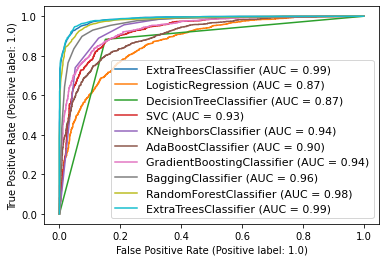

In [242]:
from sklearn.metrics import plot_roc_curve

dist=plot_roc_curve(ExtraTreesClassifier().fit(x_train,y_train),x_test,y_test)

for i in models:
    plot_roc_curve(i,x_test,y_test,ax=dist.ax_)
plt.legend(prop={'size':11}, loc= 'lower right')
plt.show()

In [243]:
import joblib
joblib.dump(best_model,"Rainfall_prediction_RainTomorrow.pkl")

['Rainfall_prediction_RainTomorrow.pkl']

In [244]:
mod = joblib.load("Rainfall_prediction_RainTomorrow.pkl")
actual_data = np.array(y_test)
predicted_data = np.array(mod.predict(x_test))
df_comparision = pd.DataFrame({'actual data':actual_data,'predicted value':predicted_data})
df_comparision

,actual data,predicted value
0,1.0,1.0
1,0.0,0.0
2,1.0,1.0
3,0.0,0.0
4,1.0,1.0
...,...,...
3694,1.0,0.0
3695,1.0,1.0
3696,0.0,0.0
3697,1.0,1.0


# Now, we have to predict "Rainfall".

In [245]:
df3

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1.0,13.4,22.9,0.617396,0.186311,7.632205,13.0,44.0,13.0,14.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,7.4,25.1,-0.693670,0.186311,7.632205,14.0,44.0,6.0,15.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,1.0,12.9,25.7,-0.693670,0.186311,7.632205,15.0,46.0,13.0,15.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,1.0,9.2,28.0,-0.693670,0.186311,7.632205,4.0,24.0,9.0,0.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,1.0,17.5,32.3,0.975076,0.186311,7.632205,13.0,41.0,1.0,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,-0.693670,0.186311,7.632205,0.0,31.0,9.0,1.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
8421,9.0,3.6,25.3,-0.693670,0.186311,7.632205,6.0,22.0,9.0,3.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
8422,9.0,5.4,26.9,-0.693670,0.186311,7.632205,3.0,37.0,9.0,14.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
8423,9.0,7.8,27.0,-0.693670,0.186311,7.632205,9.0,28.0,10.0,3.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


In [246]:
x=df3.drop('Rainfall',axis=1)
y=df3['Rainfall']
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1.0,13.4,22.9,0.186311,7.632205,13.0,44.0,13.0,14.0,20.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,7.4,25.1,0.186311,7.632205,14.0,44.0,6.0,15.0,4.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,1.0,12.9,25.7,0.186311,7.632205,15.0,46.0,13.0,15.0,19.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,1.0,9.2,28.0,0.186311,7.632205,4.0,24.0,9.0,0.0,11.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,1.0,17.5,32.3,0.186311,7.632205,13.0,41.0,1.0,7.0,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.186311,7.632205,0.0,31.0,9.0,1.0,13.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
8421,9.0,3.6,25.3,0.186311,7.632205,6.0,22.0,9.0,3.0,13.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
8422,9.0,5.4,26.9,0.186311,7.632205,3.0,37.0,9.0,14.0,9.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
8423,9.0,7.8,27.0,0.186311,7.632205,9.0,28.0,10.0,3.0,13.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


In [247]:
y

0       0.617396
1      -0.693670
2      -0.693670
3      -0.693670
4       0.975076
          ...   
8420   -0.693670
8421   -0.693670
8422   -0.693670
8423   -0.693670
8424   -0.693670
Name: Rainfall, Length: 7987, dtype: float64

In [248]:
x.dtypes

Location         float64
MinTemp          float64
MaxTemp          float64
Evaporation      float64
Sunshine         float64
WindGustDir      float64
WindGustSpeed    float64
WindDir9am       float64
WindDir3pm       float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday        float64
RainTomorrow     float64
dtype: object

In [249]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
x=pd.DataFrame(scale.fit_transform(x), columns=x.columns)
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,-1.508427,0.056265,-0.145028,0.186311,-0.013374,1.229267,0.375060,1.250245,1.400214,0.713688,...,0.184044,-1.623998,-1.688792,-1.399888,1.425345,0.013138,-0.138099,-0.098593,-0.542476,-0.543635
1,-1.508427,-1.058650,0.221372,0.186311,-0.013374,1.441960,0.375060,-0.277857,1.626597,-0.986603,...,-1.455177,-1.457576,-1.204068,-1.281756,0.011773,0.013138,-0.084254,0.329747,-0.542476,-0.543635
2,-1.508427,-0.036645,0.321299,0.186311,-0.013374,1.654654,0.531529,1.250245,1.626597,0.607420,...,-1.819449,-1.180206,-1.705507,-1.129873,0.011773,-1.076661,0.597788,0.141277,-0.542476,-0.543635
3,-1.508427,-0.724176,0.704353,0.186311,-0.013374,-0.684977,-1.189631,0.377044,-1.769138,-0.242726,...,-1.394465,-1.956843,-0.034045,-0.437958,0.011773,0.013138,0.077282,0.706687,-0.542476,-0.543635
4,-1.508427,0.818123,1.420498,0.186311,-0.013374,1.229267,0.140356,-1.369358,-0.184462,-0.667799,...,0.851874,-1.013784,-1.170639,-1.585524,1.013630,1.535531,0.023437,1.254963,-0.542476,-0.543635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913418,-0.061755,0.186311,-0.013374,-1.535751,-0.641989,0.377044,-1.542755,-0.030189,...,-1.030194,-1.513050,1.135979,0.827741,0.011773,0.013138,-1.358595,0.004208,-0.542476,-0.543635
7983,1.029423,-1.764762,0.254681,0.186311,-0.013374,-0.259589,-1.346100,0.377044,-1.089991,-0.030189,...,-0.726635,-1.679472,0.952118,0.625229,0.011773,0.013138,-1.215007,0.364014,-0.542476,-0.543635
7984,1.029423,-1.430288,0.521153,0.186311,-0.013374,-0.897670,-0.172582,0.377044,1.400214,-0.455262,...,-0.908770,-1.513050,0.534253,0.237081,0.011773,0.013138,-0.927832,0.638152,-0.542476,-0.543635
7985,1.029423,-0.984322,0.537808,0.186311,-0.013374,0.378492,-0.876693,0.595344,-1.089991,-0.030189,...,-1.030194,-1.513050,0.266819,0.186453,-0.633229,-1.076661,-0.461172,0.621019,-0.542476,-0.543635


In [250]:
viff=pd.DataFrame()
viff['Feature']=x.columns
viff['VIF']=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
viff

,Feature,VIF
0,Location,1.167494
1,MinTemp,8.353419
2,MaxTemp,26.350471
3,Evaporation,1.542519
4,Sunshine,1.979413
5,WindGustDir,1.599187
6,WindGustSpeed,2.430149
7,WindDir9am,1.341604
8,WindDir3pm,1.473525
9,WindSpeed9am,2.014501


In [251]:
x.drop('Temp3pm',axis=1,inplace=True)
x# now again check multicolinearity of whole dataframe to by vif method. 

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,RainTomorrow
0,-1.508427,0.056265,-0.145028,0.186311,-0.013374,1.229267,0.375060,1.250245,1.400214,0.713688,0.637379,0.184044,-1.623998,-1.688792,-1.399888,1.425345,0.013138,-0.138099,-0.542476,-0.543635
1,-1.508427,-1.058650,0.221372,0.186311,-0.013374,1.441960,0.375060,-0.277857,1.626597,-0.986603,0.420871,-1.455177,-1.457576,-1.204068,-1.281756,0.011773,0.013138,-0.084254,-0.542476,-0.543635
2,-1.508427,-0.036645,0.321299,0.186311,-0.013374,1.654654,0.531529,1.250245,1.626597,0.607420,0.853886,-1.819449,-1.180206,-1.705507,-1.129873,0.011773,-1.076661,0.597788,-0.542476,-0.543635
3,-1.508427,-0.724176,0.704353,0.186311,-0.013374,-0.684977,-1.189631,0.377044,-1.769138,-0.242726,-0.986428,-1.394465,-1.956843,-0.034045,-0.437958,0.011773,0.013138,0.077282,-0.542476,-0.543635
4,-1.508427,0.818123,1.420498,0.186311,-0.013374,1.229267,0.140356,-1.369358,-0.184462,-0.667799,0.204363,0.851874,-1.013784,-1.170639,-1.585524,1.013630,1.535531,0.023437,-0.542476,-0.543635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913418,-0.061755,0.186311,-0.013374,-1.535751,-0.641989,0.377044,-1.542755,-0.030189,-0.769921,-1.030194,-1.513050,1.135979,0.827741,0.011773,0.013138,-1.358595,-0.542476,-0.543635
7983,1.029423,-1.764762,0.254681,0.186311,-0.013374,-0.259589,-1.346100,0.377044,-1.089991,-0.030189,-0.986428,-0.726635,-1.679472,0.952118,0.625229,0.011773,0.013138,-1.215007,-0.542476,-0.543635
7984,1.029423,-1.430288,0.521153,0.186311,-0.013374,-0.897670,-0.172582,0.377044,1.400214,-0.455262,-0.986428,-0.908770,-1.513050,0.534253,0.237081,0.011773,0.013138,-0.927832,-0.542476,-0.543635
7985,1.029423,-0.984322,0.537808,0.186311,-0.013374,0.378492,-0.876693,0.595344,-1.089991,-0.030189,-1.202936,-1.030194,-1.513050,0.266819,0.186453,-0.633229,-1.076661,-0.461172,-0.542476,-0.543635


In [252]:
viff1=pd.DataFrame()
viff1['Feature']=x.columns
viff1['VIF']=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
viff1

,Feature,VIF
0,Location,1.165755
1,MinTemp,8.290456
2,MaxTemp,9.595582
3,Evaporation,1.541523
4,Sunshine,1.979331
5,WindGustDir,1.595928
6,WindGustSpeed,2.415857
7,WindDir9am,1.340541
8,WindDir3pm,1.472879
9,WindSpeed9am,2.013837


In [253]:
x.drop('Pressure9am',axis=1,inplace=True)
x
# now again check multicolinearity of whole dataframe to by vif method. 

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,RainTomorrow
0,-1.508427,0.056265,-0.145028,0.186311,-0.013374,1.229267,0.375060,1.250245,1.400214,0.713688,0.637379,0.184044,-1.623998,-1.399888,1.425345,0.013138,-0.138099,-0.542476,-0.543635
1,-1.508427,-1.058650,0.221372,0.186311,-0.013374,1.441960,0.375060,-0.277857,1.626597,-0.986603,0.420871,-1.455177,-1.457576,-1.281756,0.011773,0.013138,-0.084254,-0.542476,-0.543635
2,-1.508427,-0.036645,0.321299,0.186311,-0.013374,1.654654,0.531529,1.250245,1.626597,0.607420,0.853886,-1.819449,-1.180206,-1.129873,0.011773,-1.076661,0.597788,-0.542476,-0.543635
3,-1.508427,-0.724176,0.704353,0.186311,-0.013374,-0.684977,-1.189631,0.377044,-1.769138,-0.242726,-0.986428,-1.394465,-1.956843,-0.437958,0.011773,0.013138,0.077282,-0.542476,-0.543635
4,-1.508427,0.818123,1.420498,0.186311,-0.013374,1.229267,0.140356,-1.369358,-0.184462,-0.667799,0.204363,0.851874,-1.013784,-1.585524,1.013630,1.535531,0.023437,-0.542476,-0.543635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913418,-0.061755,0.186311,-0.013374,-1.535751,-0.641989,0.377044,-1.542755,-0.030189,-0.769921,-1.030194,-1.513050,0.827741,0.011773,0.013138,-1.358595,-0.542476,-0.543635
7983,1.029423,-1.764762,0.254681,0.186311,-0.013374,-0.259589,-1.346100,0.377044,-1.089991,-0.030189,-0.986428,-0.726635,-1.679472,0.625229,0.011773,0.013138,-1.215007,-0.542476,-0.543635
7984,1.029423,-1.430288,0.521153,0.186311,-0.013374,-0.897670,-0.172582,0.377044,1.400214,-0.455262,-0.986428,-0.908770,-1.513050,0.237081,0.011773,0.013138,-0.927832,-0.542476,-0.543635
7985,1.029423,-0.984322,0.537808,0.186311,-0.013374,0.378492,-0.876693,0.595344,-1.089991,-0.030189,-1.202936,-1.030194,-1.513050,0.186453,-0.633229,-1.076661,-0.461172,-0.542476,-0.543635


In [254]:
viff2=pd.DataFrame()
viff2['Feature']=x.columns
viff2['VIF']=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
viff2

,Feature,VIF
0,Location,1.165208
1,MinTemp,8.160509
2,MaxTemp,9.212254
3,Evaporation,1.524234
4,Sunshine,1.973509
5,WindGustDir,1.580564
6,WindGustSpeed,2.394186
7,WindDir9am,1.320519
8,WindDir3pm,1.403829
9,WindSpeed9am,2.013635


In [255]:
x.drop('Temp9am',axis=1,inplace=True)
x
# now again check multicolinearity of whole dataframe to by vif method. 

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,-1.508427,0.056265,-0.145028,0.186311,-0.013374,1.229267,0.375060,1.250245,1.400214,0.713688,0.637379,0.184044,-1.623998,-1.399888,1.425345,0.013138,-0.542476,-0.543635
1,-1.508427,-1.058650,0.221372,0.186311,-0.013374,1.441960,0.375060,-0.277857,1.626597,-0.986603,0.420871,-1.455177,-1.457576,-1.281756,0.011773,0.013138,-0.542476,-0.543635
2,-1.508427,-0.036645,0.321299,0.186311,-0.013374,1.654654,0.531529,1.250245,1.626597,0.607420,0.853886,-1.819449,-1.180206,-1.129873,0.011773,-1.076661,-0.542476,-0.543635
3,-1.508427,-0.724176,0.704353,0.186311,-0.013374,-0.684977,-1.189631,0.377044,-1.769138,-0.242726,-0.986428,-1.394465,-1.956843,-0.437958,0.011773,0.013138,-0.542476,-0.543635
4,-1.508427,0.818123,1.420498,0.186311,-0.013374,1.229267,0.140356,-1.369358,-0.184462,-0.667799,0.204363,0.851874,-1.013784,-1.585524,1.013630,1.535531,-0.542476,-0.543635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913418,-0.061755,0.186311,-0.013374,-1.535751,-0.641989,0.377044,-1.542755,-0.030189,-0.769921,-1.030194,-1.513050,0.827741,0.011773,0.013138,-0.542476,-0.543635
7983,1.029423,-1.764762,0.254681,0.186311,-0.013374,-0.259589,-1.346100,0.377044,-1.089991,-0.030189,-0.986428,-0.726635,-1.679472,0.625229,0.011773,0.013138,-0.542476,-0.543635
7984,1.029423,-1.430288,0.521153,0.186311,-0.013374,-0.897670,-0.172582,0.377044,1.400214,-0.455262,-0.986428,-0.908770,-1.513050,0.237081,0.011773,0.013138,-0.542476,-0.543635
7985,1.029423,-0.984322,0.537808,0.186311,-0.013374,0.378492,-0.876693,0.595344,-1.089991,-0.030189,-1.202936,-1.030194,-1.513050,0.186453,-0.633229,-1.076661,-0.542476,-0.543635


In [256]:
viff3=pd.DataFrame()
viff3['Feature']=x.columns
viff3['VIF']=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
viff3

,Feature,VIF
0,Location,1.150509
1,MinTemp,4.348243
2,MaxTemp,5.451034
3,Evaporation,1.521607
4,Sunshine,1.966625
5,WindGustDir,1.579985
6,WindGustSpeed,2.359017
7,WindDir9am,1.320295
8,WindDir3pm,1.403641
9,WindSpeed9am,1.980443


In [257]:
y.value_counts()

-0.693670    5071
-0.069871     390
 1.521477     232
 0.336132     176
 0.617396     115
             ... 
 1.828239       1
 1.828495       1
 1.824542       1
 1.830174       1
 1.826341       1
Name: Rainfall, Length: 171, dtype: int64

In [261]:
from sklearn.ensemble import RandomForestRegressor


maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.30,random_state=i)
    rfr=RandomForestRegressor()
    rfr.fit(x_train,y_train)
    pred = rfr.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu,"at Random_state",maxRS)

Maximum r2 score is  0.8932412908772829 at Random_state 69


In [262]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=69)

In [264]:
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import ExtraTreesRegressor

In [277]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [295]:
models=[SVR(),KNeighborsRegressor(),AdaBoostRegressor(),RandomForestRegressor(), ExtraTreesRegressor(),BaggingRegressor(),GradientBoostingRegressor()]
r2_scor=[]

def sklearn_model_accuracy():
    for model in models:
        print(model)
        model.fit(x_train,y_train)
        model_predict=model.predict(x_test)
        print('Model Score:',model.score(x_train,y_train))
        print('R2 Score:',r2_score(y_test,model_predict))
        print('MAE:',mean_absolute_error(y_test,model_predict))
        print('MSE:',mean_squared_error(y_test,model_predict))
        print('RMSE:',np.sqrt(mean_squared_error(y_test,model_predict)))
        r2_scor.append(r2_score(y_test,model_predict))
        print("-------------------------------------------------------------")


In [296]:
sklearn_model_accuracy()

SVR()
Model Score: 0.8247524859958761
R2 Score: 0.8273570693677491
MAE: 0.21921290187226863
MSE: 0.16857561405566965
RMSE: 0.4105796074522816
-------------------------------------------------------------
KNeighborsRegressor()
Model Score: 0.8465440686734332
R2 Score: 0.78585056874601
MAE: 0.2658488732663031
MSE: 0.2091042577944399
RMSE: 0.45727919020488994
-------------------------------------------------------------
AdaBoostRegressor()
Model Score: 0.7249249233040457
R2 Score: 0.7273628844533729
MAE: 0.42145202766553025
MSE: 0.26621402335632954
RMSE: 0.5159593233543993
-------------------------------------------------------------
RandomForestRegressor()
Model Score: 0.9804153280972142
R2 Score: 0.8938761235236222
MAE: 0.20322500566817503
MSE: 0.10362369068607237
RMSE: 0.3219063383751124
-------------------------------------------------------------
ExtraTreesRegressor()
Model Score: 0.9986958993500976
R2 Score: 0.9070550913017817
MAE: 0.1678524832630749
MSE: 0.09075520787193685
RMSE: 0

In [297]:
score=pd.DataFrame({'Model':models,'Model R2_Score':r2_scor})
score

,Model,Model R2_Score
0,SVR(),0.827357
1,KNeighborsRegressor(),0.785851
2,"(DecisionTreeRegressor(max_depth=3, random_sta...",0.727363
3,"(DecisionTreeRegressor(max_features='auto', ra...",0.893876
4,"(ExtraTreeRegressor(random_state=1196782299), ...",0.907055
5,(DecisionTreeRegressor(random_state=487983229)...,0.880554
6,([DecisionTreeRegressor(criterion='friedman_ms...,0.831327


In [311]:
print(cross_val_score(lasso,x,y,cv=5).mean())

0.7843948700074626


In [310]:
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings('ignore')

In [312]:
gcv=GridSearchCV(lasso,parameters,cv=5)
gcv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=Lasso(alpha=0.001, random_state=0),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10],
                         'random_state': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                          12, 13, 14, 15, 16, 17, 18, 19, 20,
                                          21, 22, 23, 24, 25, 26, 27, 28, 29, ...]})

In [313]:
gcv.best_params_

{'alpha': 0.001, 'random_state': 0}

In [315]:
param=Lasso(alpha=.001,random_state=0)
param.fit(x_train,y_train)
param.score(x_train,y_train)
best_score=param.predict(x_test)

print('R2 Score:',r2_score(y_test,best_score))
print('MAE:',mean_absolute_error(y_test,best_score))
print('MSE:',mean_squared_error(y_test,best_score))
print('RMSE:',np.sqrt(mean_squared_error(y_test,best_score)))

R2 Score: 0.8051514886457143
MAE: 0.2879951171318263
MSE: 0.19025805070089472
RMSE: 0.436185798371399


In [319]:
joblib.dump(best_score,"Rainfall_prediction.pkl")

['Rainfall_prediction.pkl']